#**Librerías y configuraciones**

In [41]:
import os
import glob
from IPython.display import display, Image, clear_output
import matplotlib.pyplot as plt

In [42]:
import cv2
import numpy as np
import pandas as pd


from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [43]:
import math

In [44]:
import random

In [45]:
# from IPython.display import clear_output
# display.clear_output()

In [46]:
# Para descargar el dataset

!pip install roboflow
from roboflow import Roboflow

Chequeamos si estamos usando GPU

In [47]:
!nvidia-smi

Fri Dec 13 01:43:02 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              10W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [48]:
HOME = os.getcwd()

In [49]:
print(HOME)

/content


In [50]:
!pip install ultralytics

Chequear si YOLO está instalado

In [51]:
import ultralytics

In [52]:
ultralytics.checks()

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.2/112.6 GB disk)


# **Dataset**

**Importamos American Sign Language Alphabets Dataset de Roboflow**

El dataset se encuentra en este link https://universe.roboflow.com/david-lee-d0rhs/american-sign-language-letters

In [12]:
# !rm -rf /content/dataset

In [13]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

rf = Roboflow(api_key="jr9B0k6abSGwqH8TD8Am")
project = rf.workspace("david-lee-d0rhs").project("american-sign-language-letters")
dataset = project.version(1).download("yolov11")

/content/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to American-Sign-Language-Letters-1 in yolov11:: 100%|██████████| 3468/3468 [00:00<00:00, 7186.27it/s]


In [14]:
# Ruta principal del dataset
dataset_path = "/content/datasets/American-Sign-Language-Letters-1"

In [15]:
# Función para contar las imágenes por clase en el conjunto de entrenamiento (train)
def count_images_in_train(dataset_path):
    class_counts = {}
    # Ruta para el conjunto de entrenamiento
    train_path = os.path.join(dataset_path, 'train', 'images')

    # Recorrer los archivos en la carpeta 'images'
    for filename in os.listdir(train_path):
        # Verificar que el archivo sea una imagen (en este caso .jpg o .png)
        if filename.endswith('.jpg') or filename.endswith('.png'):
            # Extraer la clase del nombre del archivo, asumiendo que el prefijo es la clase
            # Ejemplo: "B19_jpg.rf.69527cc1f34d694cc04e55db80ed9b1a.jpg"
            class_label = filename.split('_')[0]  # Extrae 'B19' de 'B19_jpg.rf...'
            class_label = filename[0]  # Extrae solo la letra (por ejemplo, 'B' de 'B20')

            # Contar las imágenes por clase
            class_counts[class_label] = class_counts.get(class_label, 0) + 1
    return class_counts

In [16]:
# Contar las imágenes por clase en el conjunto de entrenamiento
class_counts = count_images_in_train(dataset_path)
print(class_counts)
len(class_counts)

{'S': 69, 'C': 54, 'L': 72, 'D': 63, 'I': 78, 'U': 48, 'E': 63, 'G': 60, 'X': 63, 'B': 39, 'P': 51, 'Q': 60, 'R': 48, 'V': 57, 'A': 69, 'F': 60, 'T': 42, 'Y': 48, 'O': 54, 'J': 78, 'N': 60, 'K': 51, 'H': 51, 'Z': 66, 'W': 57, 'M': 51}


26

In [17]:
# Visualizar los resultados
letters = list(class_counts.keys())
counts = list(class_counts.values())

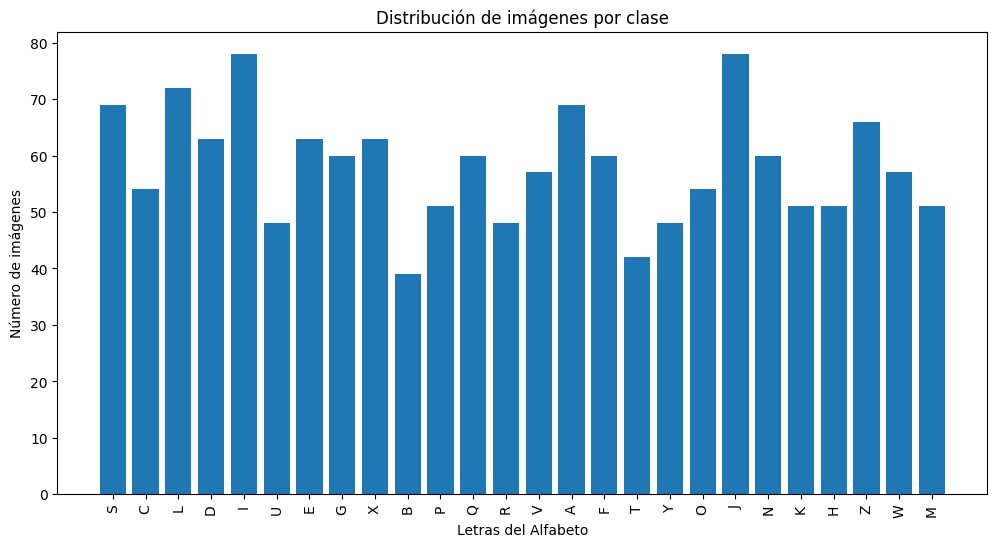

In [18]:
# Crear gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(letters, counts)
plt.xlabel('Letras del Alfabeto')
plt.ylabel('Número de imágenes')
plt.title('Distribución de imágenes por clase')
plt.xticks(rotation=90)
plt.show()

In [19]:
import pandas as pd

# Crear un DataFrame con los resultados
df = pd.DataFrame(list(class_counts.items()), columns=['Letra', 'Número de Imágenes'])

# Calcular el porcentaje de imágenes por clase
total_images = df['Número de Imágenes'].sum()
df['Porcentaje'] = (df['Número de Imágenes'] / total_images) * 100

# Show the dataframe directly.
display(df) # This shows the dataframe in the notebook


# Mostrar el DataFrame en la salida
print(df)

,Letra,Número de Imágenes,Porcentaje
0,S,69,4.563492
1,C,54,3.571429
2,L,72,4.761905
3,D,63,4.166667
4,I,78,5.158730
5,U,48,3.174603
6,E,63,4.166667
7,G,60,3.968254
8,X,63,4.166667
9,B,39,2.579365


   Letra  Número de Imágenes  Porcentaje
0      S                  69    4.563492
1      C                  54    3.571429
2      L                  72    4.761905
3      D                  63    4.166667
4      I                  78    5.158730
5      U                  48    3.174603
6      E                  63    4.166667
7      G                  60    3.968254
8      X                  63    4.166667
9      B                  39    2.579365
10     P                  51    3.373016
11     Q                  60    3.968254
12     R                  48    3.174603
13     V                  57    3.769841
14     A                  69    4.563492
15     F                  60    3.968254
16     T                  42    2.777778
17     Y                  48    3.174603
18     O                  54    3.571429
19     J                  78    5.158730
20     N                  60    3.968254
21     K                  51    3.373016
22     H                  51    3.373016
23     Z        

In [20]:
# Ordenar por letra (alfabéticamente)
df['Letra'] = df['Letra'].apply(lambda x: x[0])  # Asegurarse de que solo se toma la letra
df = df.sort_values(by='Letra').reset_index(drop=True)

# Mostrar el DataFrame en la salida
print(df)


   Letra  Número de Imágenes  Porcentaje
0      A                  69    4.563492
1      B                  39    2.579365
2      C                  54    3.571429
3      D                  63    4.166667
4      E                  63    4.166667
5      F                  60    3.968254
6      G                  60    3.968254
7      H                  51    3.373016
8      I                  78    5.158730
9      J                  78    5.158730
10     K                  51    3.373016
11     L                  72    4.761905
12     M                  51    3.373016
13     N                  60    3.968254
14     O                  54    3.571429
15     P                  51    3.373016
16     Q                  60    3.968254
17     R                  48    3.174603
18     S                  69    4.563492
19     T                  42    2.777778
20     U                  48    3.174603
21     V                  57    3.769841
22     W                  57    3.769841
23     X        

In [21]:
# Guardar el DataFrame como un archivo CSV
df.to_csv('/content/dataset.csv', index=False)

# Generar un enlace para descargar el archivo CSV
from google.colab import files
files.download('/content/dataset.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
# Calcular el porcentaje de imágenes por clase
total_images = df['Número de Imágenes'].sum()
df['Porcentaje'] = (df['Número de Imágenes'] / total_images) * 100

# Ordenar por letra (alfabéticamente)
df['Letra'] = df['Letra'].apply(lambda x: x[0])  # Asegurarse de que solo se toma la letra
df = df.sort_values(by='Letra').reset_index(drop=True)

# Filtrar clases con un porcentaje menor a 3.5
classes_below_3_5 = df[df['Porcentaje'] < 3.5]

# Contar el número de clases con porcentaje menor a 3.5
num_classes_below_3_5 = classes_below_3_5.shape[0]
num_classes_below_3_5

9

In [23]:
# Verificar si el dataset está balanceado
total_images = sum(counts)
average = total_images / len(class_counts)
print(f"Total de imágenes: {total_images}")
print(f"Promedio por clase: {average}")

Total de imágenes: 1512
Promedio por clase: 58.15384615384615


En general, las clases están bastante equilibradas. Aquí algunos puntos clave:

Las clases con un porcentaje menor a 3.5% son B (2.58%), T (2.78%) y C (3.57%). Esto indica que hay algunas clases que tienen menos representación que otras, pero la diferencia no es tan drástica.
Las clases que están por encima del 3.5% tienen una distribución más uniforme, con valores que oscilan entre el 3.37% y el 5.16%, lo que indica que el dataset está razonablemente equilibrado.

Reliazaremos el 1er desarrollo con estos datos y luego veremos si es necesario relizar data argumentation

# GitHub

In [24]:
!pwd

/content/datasets


In [25]:
%cd /content

/content


In [26]:

# !git clone https://github.com/LaraV15/TP-CV.git

Cloning into 'TP-CV'...
remote: Enumerating objects: 3573, done.
remote: Counting objects: 100% (50/50), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 3573 (delta 6), reused 50 (delta 6), pack-reused 3523 (from 1)
Receiving objects: 100% (3573/3573), 176.23 MiB | 15.16 MiB/s, done.
Resolving deltas: 100% (19/19), done.
Updating files: 100% (3549/3549), done.


# **Modelo N°1**

## **Entrenamos YOLOv8**

In [ ]:
import yaml

# Ruta al archivo data.yaml
yaml_path = '/content/TP-CV/datasets/American-Sign-Language-Letters-1/data.yaml'

# Leer el archivo YAML
with open(yaml_path, 'r') as file:
    data = yaml.safe_load(file)

# Modificar las rutas de las imágenes
data['train'] = '/content/TP-CV/datasets/American-Sign-Language-Letters-1/train/images'
data['val'] = '/content/TP-CV/datasets/American-Sign-Language-Letters-1/valid/images'

# Guardar el archivo YAML actualizado
with open(yaml_path, 'w') as file:
    yaml.dump(data, file)

print("Rutas actualizadas correctamente.")


Rutas actualizadas correctamente.


In [ ]:
import os

# Verificar la existencia de las imágenes de entrenamiento
print(os.listdir('/content/datasets/American-Sign-Language-Letters-1/train/images'))

# Verificar la existencia de las imágenes de validación
print(os.listdir('/content/datasets/American-Sign-Language-Letters-1/valid/images'))


In [ ]:
%cd {HOME}

In [ ]:
%cd {dataset.location}

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=/content/yolov8l.pt data=/content/datasets/American-Sign-Language-Letters-1/data.yaml epochs=20 imgsz=800

/content
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/yolov8l.pt, data=/content/datasets/American-Sign-Language-Letters-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro

## Guardamos en gitHub

In [ ]:
# Configura tu nombre de usuario y correo electrónico en Git


In [ ]:
!git clone https://github.com/LaraV15/TP-CV.git


Cloning into 'TP-CV'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (3/3), done.


In [ ]:
!rm -r /content/TP-CV/TP-CV


In [ ]:
import shutil

# # Mueve toda la carpeta 'runs' al repositorio clonado
# shutil.move('/content/runs', '/content/TP-CV')

# Mueve toda la carpeta 'runs' al repositorio clonado
shutil.move('/content/datasets', '/content/TP-CV')


'/content/TP-CV/datasets'

In [ ]:
%cd /content/TP-CV


/content/TP-CV


In [ ]:
!git add .

# Hacer commit de los archivos
!git commit -m "Subiendo pesos entrenados y resultados de entrenamiento"

[main 8fb8c81] Subiendo pesos entrenados y resultados de entrenamiento
 3461 files changed, 1780 insertions(+), 1 deletion(-)
 delete mode 160000 TP-CV
 create mode 100644 datasets/American-Sign-Language-Letters-1/README.roboflow.txt
 create mode 100644 datasets/American-Sign-Language-Letters-1/data.yaml
 create mode 100644 datasets/American-Sign-Language-Letters-1/test/images/A22_jpg.rf.f02ad8558ce1c88213b4f83c0bc66bc8.jpg
 create mode 100644 datasets/American-Sign-Language-Letters-1/test/images/B14_jpg.rf.ed5ba6d44f55ab03e62d2baeac4aa1aa.jpg
 create mode 100644 datasets/American-Sign-Language-Letters-1/test/images/B15_jpg.rf.0f0628552139144fc67c453e1f1b7b15.jpg
 create mode 100644 datasets/American-Sign-Language-Letters-1/test/images/B19_jpg.rf.69527cc1f34d694cc04e55db80ed9b1a.jpg
 create mode 100644 datasets/American-Sign-Language-Letters-1/test/images/C17_jpg.rf.ceb81f8ae3c3673bd060ebe71848eca8.jpg
 create mode 100644 datasets/American-Sign-Language-Letters-1/test/images/C19_jpg.rf

In [ ]:
# Empuja los cambios al repositorio remoto
# !git push origin main


fatal: could not read Username for 'https://github.com': No such device or address


In [ ]:
!ls {HOME}/TP-CV/runs/detect/train/

args.yaml  weights


## Matriz de confusión




/content


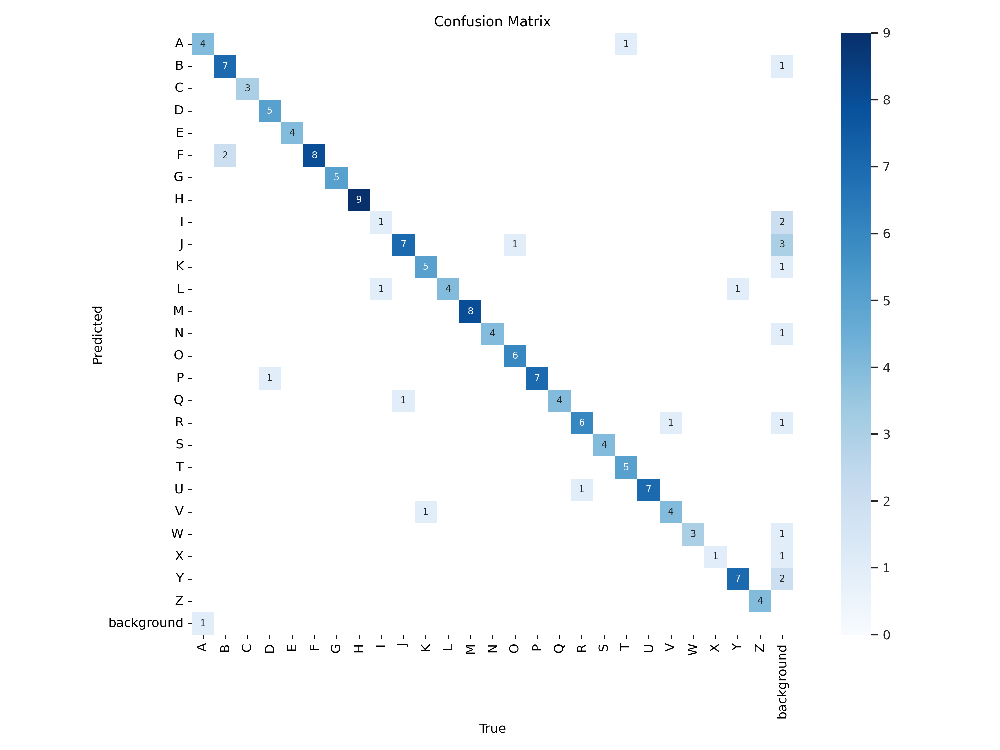

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/TP-CV/runs/detect/train9/confusion_matrix.png', width=900)

## Training and Validation Loss

/content


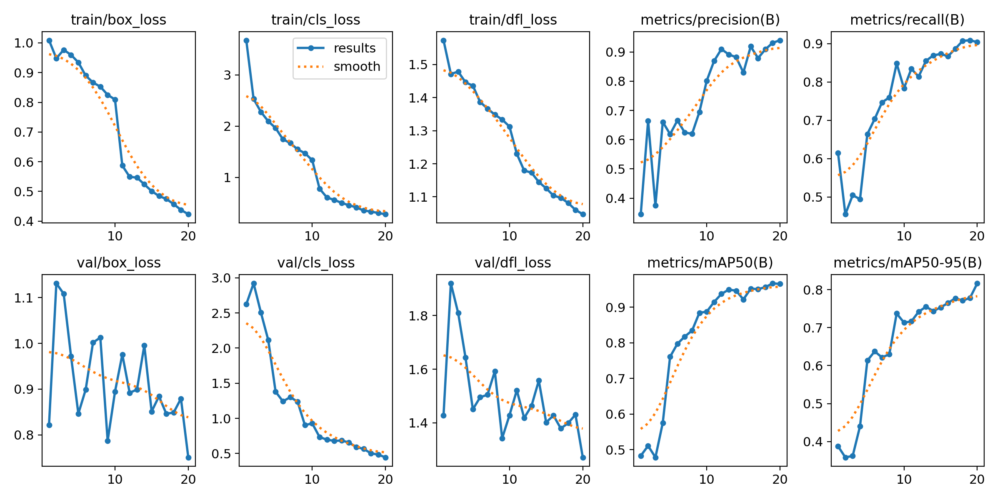

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/TP-CV/runs/detect/train9/results.png', width=600)

/content


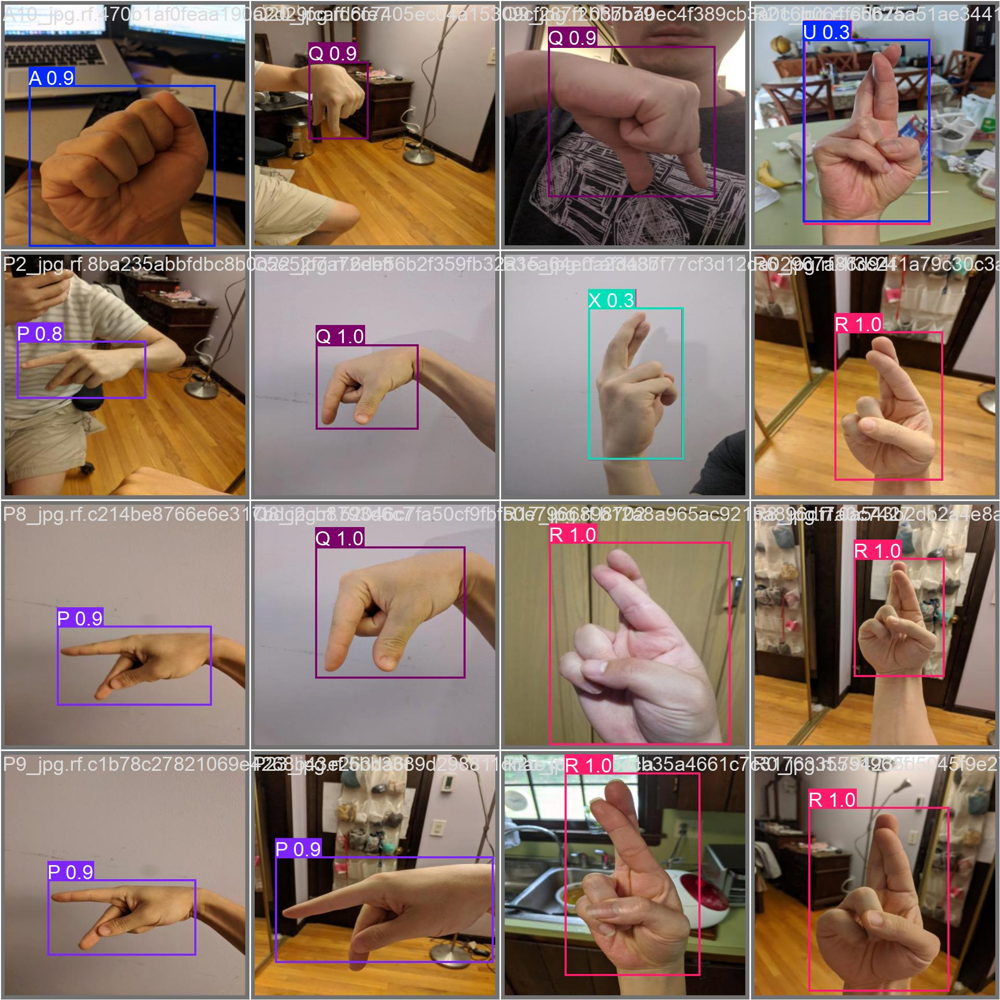

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/TP-CV/runs/detect/train9/val_batch0_pred.jpg', width=600)

## Validamos el modelo

In [27]:
%cd {HOME}

!yolo task=detect mode=val model=/content/TP-CV/runs/detect/train9/weights/best.pt data=/content/TP-CV/datasets/American-Sign-Language-Letters-1/data.yaml

/content
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43,626,654 parameters, 0 gradients, 164.9 GFLOPs
100% 755k/755k [00:00<00:00, 119MB/s]
val: Scanning /content/datasets/American-Sign-Language-Letters-1/valid/labels... 144 images, 0 backgrounds, 0 corrupt: 100% 144/144 [00:00<00:00, 1748.00it/s]
val: New cache created: /content/datasets/American-Sign-Language-Letters-1/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 9/9 [00:11<00:00,  1.24s/it]
                   all        144        144       0.94      0.904      0.965      0.816
                     A          5          5      0.931        0.8      0.962      0.833
                     B          9          9          1      0.658      0.995      0.873
                     C          3          3      0.944          1      0.995      0.841
                     D          6          6          

## Testing del modelo

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model=/content/TP-CV/runs/detect/train9/weights/best.pt conf=0.25 source=/content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images

/content
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43,626,654 parameters, 0 gradients, 164.9 GFLOPs

image 1/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/A22_jpg.rf.f02ad8558ce1c88213b4f83c0bc66bc8.jpg: 800x800 1 A, 101.6ms
image 2/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B14_jpg.rf.ed5ba6d44f55ab03e62d2baeac4aa1aa.jpg: 800x800 1 B, 54.0ms
image 3/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B15_jpg.rf.0f0628552139144fc67c453e1f1b7b15.jpg: 800x800 1 B, 55.3ms
image 4/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B19_jpg.rf.69527cc1f34d694cc04e55db80ed9b1a.jpg: 800x800 1 B, 56.3ms
image 5/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/C17_jpg.rf.ceb81f8ae3c3673bd060ebe71848eca8.jpg: 800x800 1 C, 57.0ms
image 6/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/image

In [ ]:
# import glob
# from IPython.display import Image, display

# for image_path in glob.glob('/content/runs/detect/predict*.jpg')[:3]:
#     display(Image(filename=image_path, width=600))
#     print("\n")

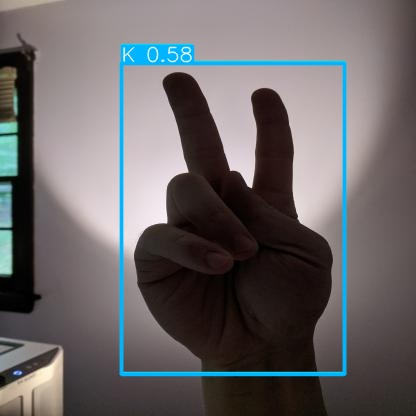

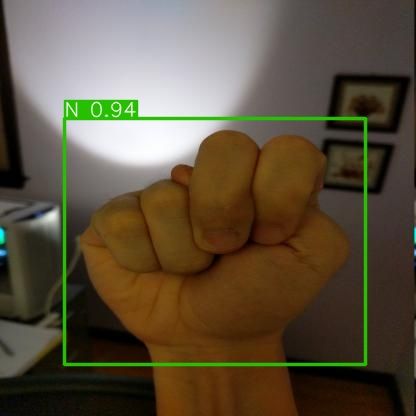

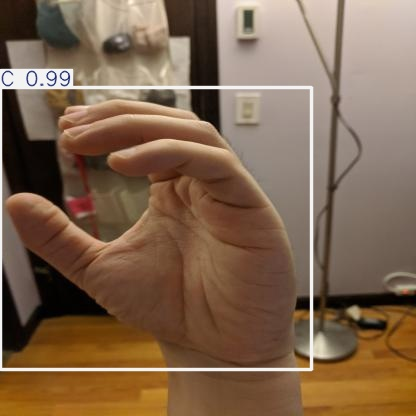

In [ ]:
import os
import random
from IPython.display import Image, display

# Obtener todos los archivos en la carpeta
image_dir = '/content/runs/detect/predict'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Seleccionar 3 imágenes al azar
random_images = random.sample(image_files, 3)

# Mostrar las imágenes seleccionadas al azar
for image_name in random_images:
    image_path = os.path.join(image_dir, image_name)
    display(Image(filename=image_path, width=600))
    print("\n")


## **Testing con imagenes nuevas**

In [29]:
!yolo task=detect mode=predict model=/content/TP-CV/runs/detect/train9/weights/best.pt conf=0.25 source=/content/new_test_images save=True


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43,626,654 parameters, 0 gradients, 164.9 GFLOPs

image 1/9 /content/new_test_images/1.jpeg: 800x608 1 A, 85.5ms
image 2/9 /content/new_test_images/2.jpeg: 800x608 1 B, 51.4ms
image 3/9 /content/new_test_images/3.jpeg: 800x608 1 C, 51.5ms
image 4/9 /content/new_test_images/4.jpeg: 800x608 1 I, 51.4ms
image 5/9 /content/new_test_images/5.jpeg: 800x608 1 L, 44.6ms
image 6/9 /content/new_test_images/6.jpeg: 800x608 1 E, 42.7ms
image 7/9 /content/new_test_images/7.jpeg: 800x608 1 K, 1 U, 42.3ms
image 8/9 /content/new_test_images/8.jpeg: 800x608 1 N, 39.6ms
image 9/9 /content/new_test_images/9.jpeg: 800x608 1 U, 39.9ms
Speed: 4.1ms preprocess, 49.9ms inference, 123.3ms postprocess per image at shape (1, 3, 800, 608)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [36]:
# Obtener todos los archivos en la carpeta
image_dir = '/content/runs/detect/predict'

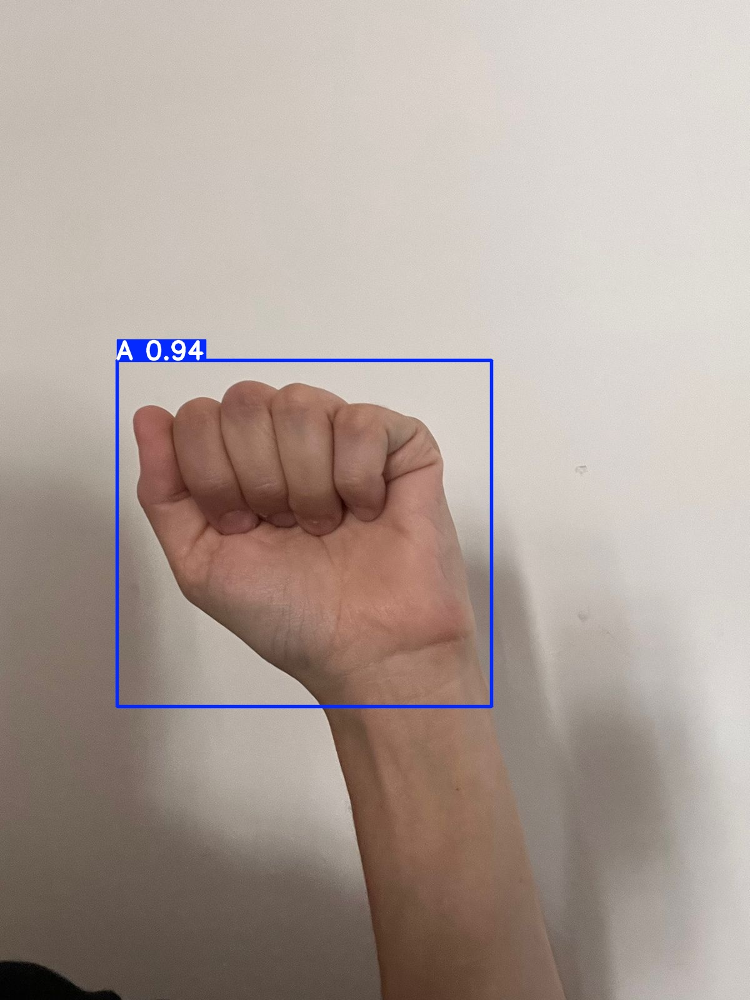

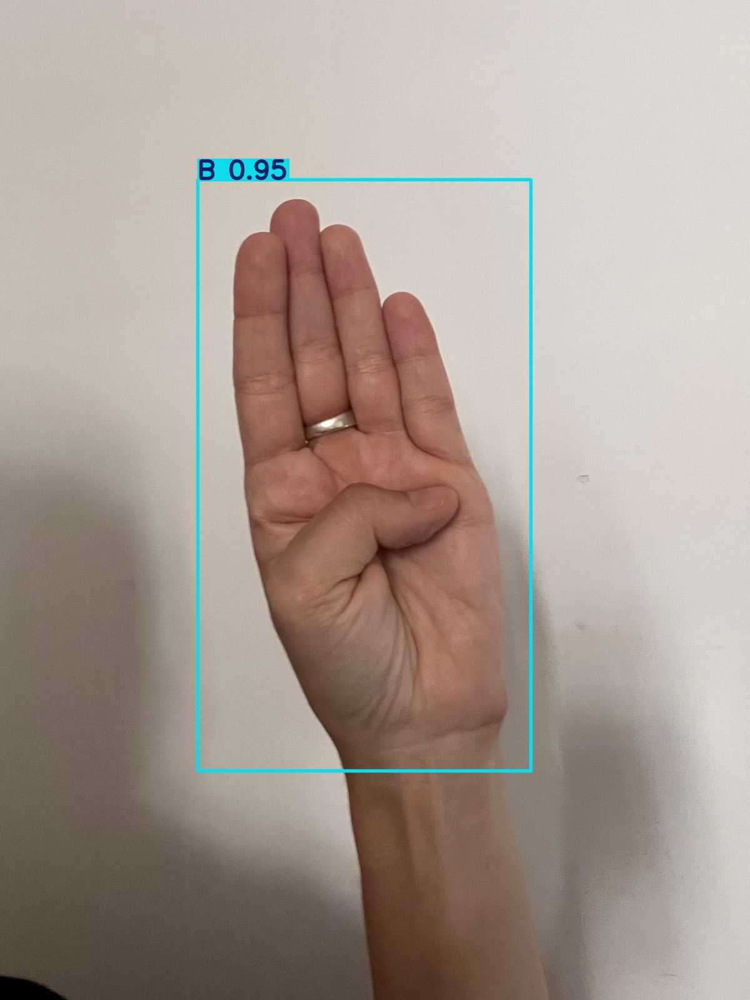

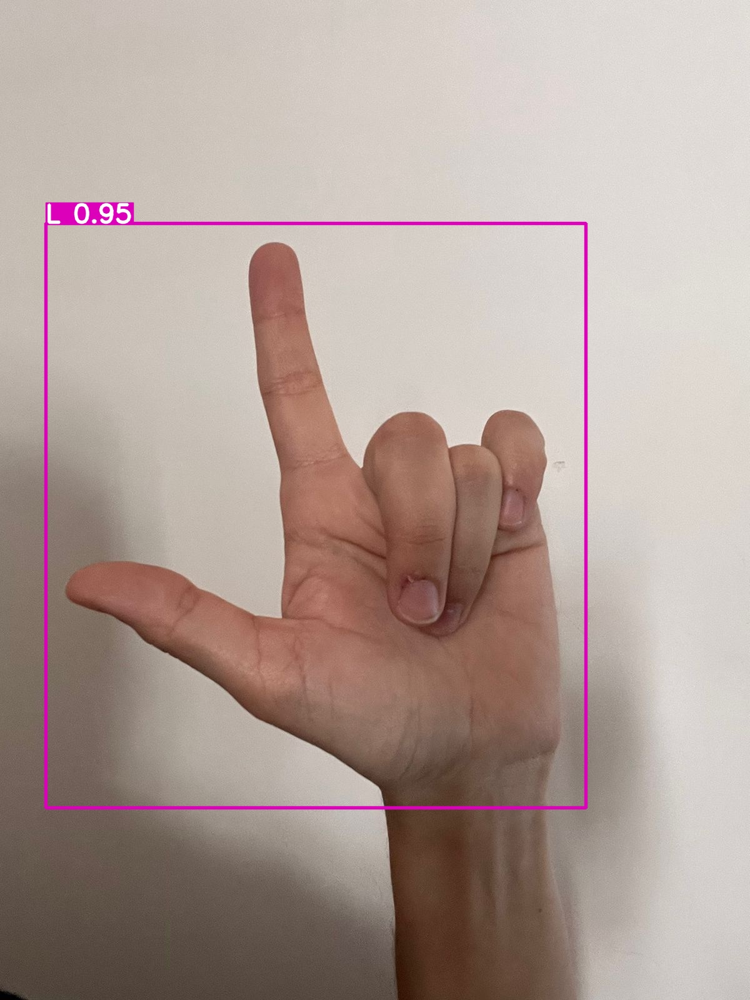

In [33]:
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Seleccionar 3 imágenes al azar
random_images = random.sample(image_files, 3)

# Mostrar las imágenes seleccionadas al azar
for image_name in random_images:
    image_path = os.path.join(image_dir, image_name)
    display(Image(filename=image_path, width=600))
    print("\n")


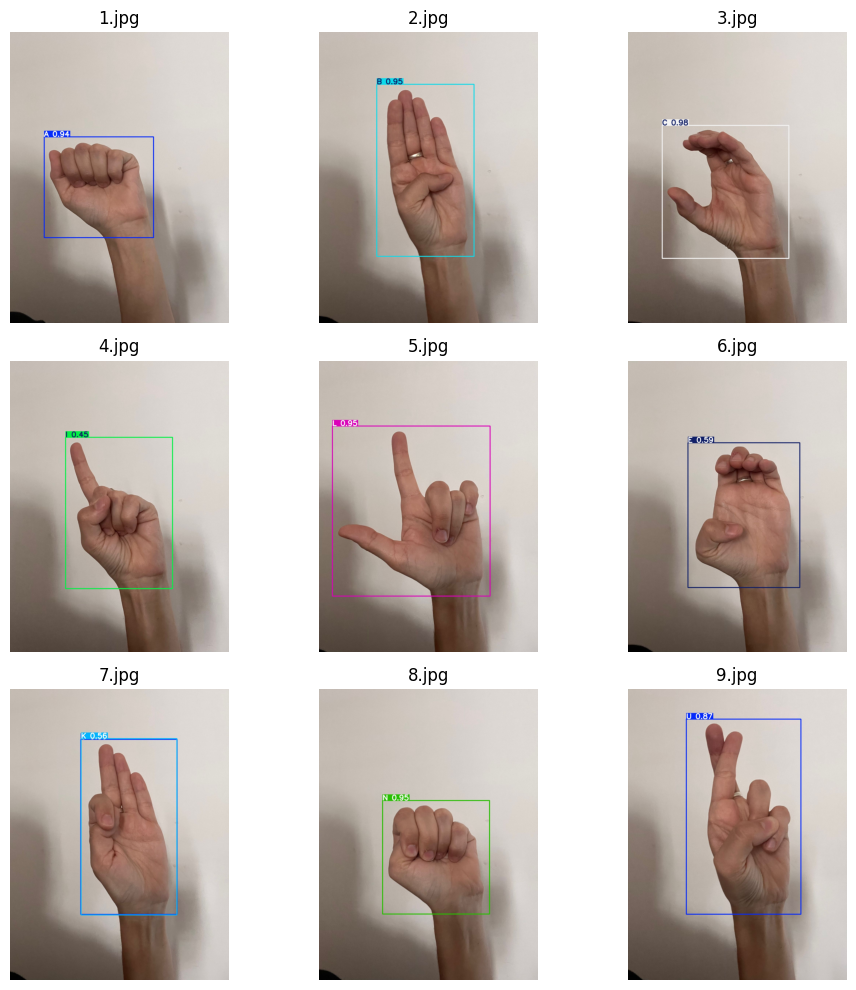

In [38]:
from PIL import Image # Make sure to import the correct Image class from PIL

# Obtener todos los archivos de imagen (filtrar por extensión .jpg, .png, etc.)
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Ordenar las imágenes por nombre (opcional)
image_files.sort()

# Mostrar las primeras 9 imágenes en una cuadrícula de 3x3
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    if i < len(image_files):  # Asegurarse de no exceder la cantidad de imágenes
        img_path = os.path.join(image_dir, image_files[i])
        img = Image.open(img_path) # Use the Image class from PIL
        ax.imshow(img)
        ax.set_title(image_files[i])  # Mostrar el nombre del archivo como título (opcional)
        ax.axis('off')  # Ocultar ejes
    else:
        ax.axis('off')  # Desactivar ejes para celdas vacías

plt.tight_layout()
plt.show()

## Testing con camara

In [ ]:
!pip install opencv-python-headless
!pip install pyngrok

In [ ]:
from IPython.display import display, Javascript, Image
import time
import cv2
import numpy as np
from ipywidgets import Image as ipyImage

In [ ]:
# def video_stream():
#     # Creamos un widget HTML para mostrar el video de la cámara
#     display(Javascript("""
#         const video = document.createElement('video');
#         video.width = 640;
#         video.height = 480;
#         video.autoplay = true;
#         document.body.appendChild(video);

#         navigator.mediaDevices.getUserMedia({video: true})
#             .then(stream => { video.srcObject = stream; });

#         video.onloadedmetadata = function() {
#             window.stream = stream;
#         };
#     """))

#     time.sleep(2)  # Dejamos tiempo para que se abra la cámara

#     # Abrir la cámara
#     cap = cv2.VideoCapture(0)

#     # Cargar el modelo YOLOv8
#     from ultralytics import YOLO
#     model = YOLO('/content/TP-CV/runs/detect/train9/weights/best.pt')

#     while True:
#         ret, frame = cap.read()
#         if not ret:
#             break

#         # Realizar predicción con YOLO
#         results = model(frame)

#         # Mostrar los resultados
#         results.show()

#         # Mostrar la imagen en el entorno de Google Colab
#         cv2_imshow(frame)

#         time.sleep(0.1)

#     cap.release()  # Cerrar la cámara

# # Llamamos a la función
# video_stream()

## **Testing con video**

In [ ]:
!yolo task=detect mode=predict model=/content/TP-CV/runs/detect/train9/weights/best.pt conf=0.25 source='/content/video.mp4'

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43,626,654 parameters, 0 gradients, 164.9 GFLOPs

video 1/1 (frame 1/2423) /content/video.mp4: 800x800 1 S, 77.1ms
video 1/1 (frame 2/2423) /content/video.mp4: 800x800 1 S, 71.6ms
video 1/1 (frame 3/2423) /content/video.mp4: 800x800 1 S, 66.6ms
video 1/1 (frame 4/2423) /content/video.mp4: 800x800 1 S, 64.7ms
video 1/1 (frame 5/2423) /content/video.mp4: 800x800 1 S, 63.8ms
video 1/1 (frame 6/2423) /content/video.mp4: 800x800 1 S, 57.7ms
video 1/1 (frame 7/2423) /content/video.mp4: 800x800 1 S, 56.1ms
video 1/1 (frame 8/2423) /content/video.mp4: 800x800 1 S, 56.0ms
video 1/1 (frame 9/2423) /content/video.mp4: 800x800 1 S, 55.7ms
video 1/1 (frame 10/2423) /content/video.mp4: 800x800 1 S, 56.3ms
video 1/1 (frame 11/2423) /content/video.mp4: 800x800 1 S, 56.7ms
video 1/1 (frame 12/2423) /content/video.mp4: 800x800 1 S, 57.2ms
video 1/1 (frame 13/2423) /content/video.mp4: 800x

In [ ]:
# import cv2
# from google.colab.patches import cv2_imshow

# # Ruta del video procesado
# video_path = '/content/runs/detect/predict3/video.avi'

# # Abrir el video procesado
# cap = cv2.VideoCapture(video_path)

# # Leer y mostrar cada cuadro
# while cap.isOpened():
#     ret, frame = cap.read()
#     if not ret:
#         break

#     # Mostrar el cuadro con OpenCV en Colab
#     cv2_imshow(frame)

#     # Esperar un poco entre los cuadros para evitar sobrecargar el sistema
#     cv2.waitKey(1)

# # Liberar el video
# cap.release()
# cv2.destroyAllWindows()


In [ ]:
# import cv2
# from google.colab.patches import cv2_imshow

# # Ruta del video procesado (asegúrate de que el video esté en el formato correcto)
# video_path = '/content/runs/detect/predict3/video.avi'

# # Abrir el video procesado
# cap = cv2.VideoCapture(video_path)

# # Verificar si el video se abrió correctamente
# if not cap.isOpened():
#     print("Error: No se puede abrir el video.")
# else:
#     # Leer y mostrar cada cuadro del video
#     while True:
#         ret, frame = cap.read()
#         if not ret:
#             break

#         # Mostrar el cuadro del video
#         cv2_imshow(frame)

#         # Esperar 1 ms antes de mostrar el siguiente cuadro
#         cv2.waitKey(1)

# # Liberar el video
# cap.release()
# cv2.destroyAllWindows()


## Video generado

In [ ]:
# !rm "/content/result_compressed.mp4"

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict3/video.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Implemento NMS

In [40]:
# !yolo task=detect mode=predict model=/content/TP-CV/runs/detect/train9/weights/best.pt conf=0.25 source='/content/video.mp4' iou-thres=0.5


In [ ]:
# # Input video path
# save_path = '/content/runs/detect/predict3/video.avi'

# # Compressed video path
# compressed_path = "/content/result_compressed.mp4"

# os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# # Show video
# mp4 = open(compressed_path,'rb').read()
# data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
# HTML("""
# <video width=400 controls>
#       <source src="%s" type="video/mp4">
# </video>
# """ % data_url)

# **Modelo N°2**

YOLOv8m

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=/content/yolov8m.pt data=/content/datasets/American-Sign-Language-Letters-1/data.yaml epochs=20 imgsz=800

/content
100% 49.7M/49.7M [00:00<00:00, 354MB/s]
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/yolov8m.pt, data=/content/datasets/American-Sign-Language-Letters-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, sa

In [ ]:
import shutil

# Define la ruta de la carpeta que quieres descargar
folder_path = '/content/runs'

# Define el nombre del archivo comprimido
zip_file = 'runs.2.zip'  # Reemplaza con la ruta y nombre del archivo .zip

# Comprimir la carpeta
shutil.make_archive(zip_file.replace('.zip', ''), 'zip', folder_path)

# Descargar el archivo comprimido
from google.colab import files
files.download(zip_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Matriz de confusión

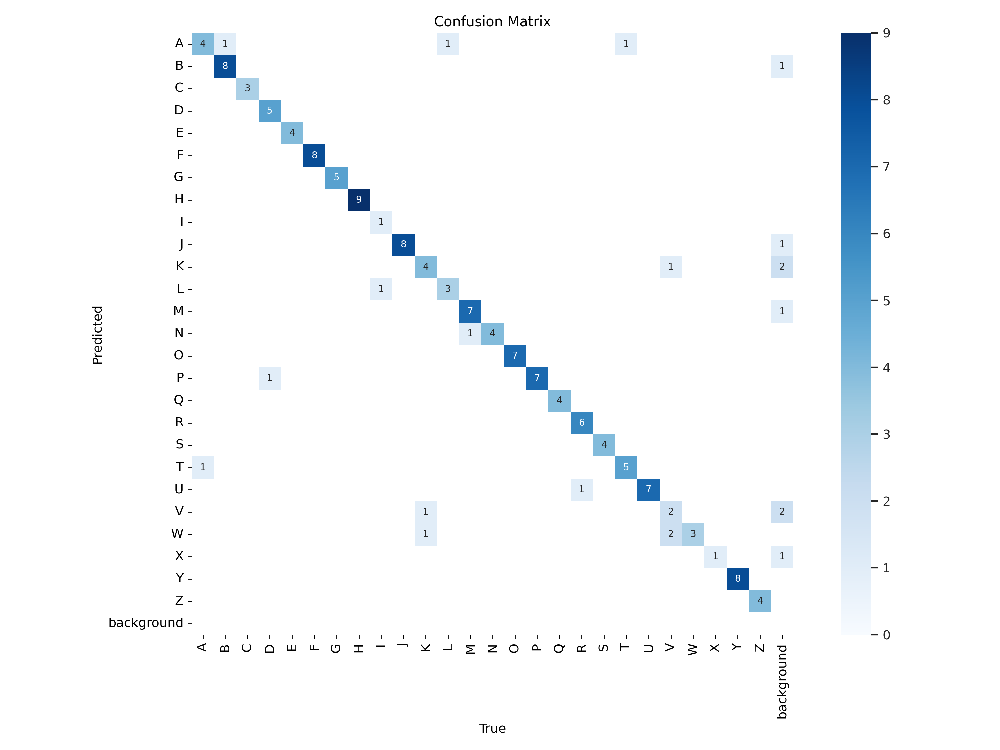

In [55]:
Image(filename='/content/TP-CV/runs-2/detect/train/confusion_matrix.png', width=900)

## Perdida de entrenamiento y validación



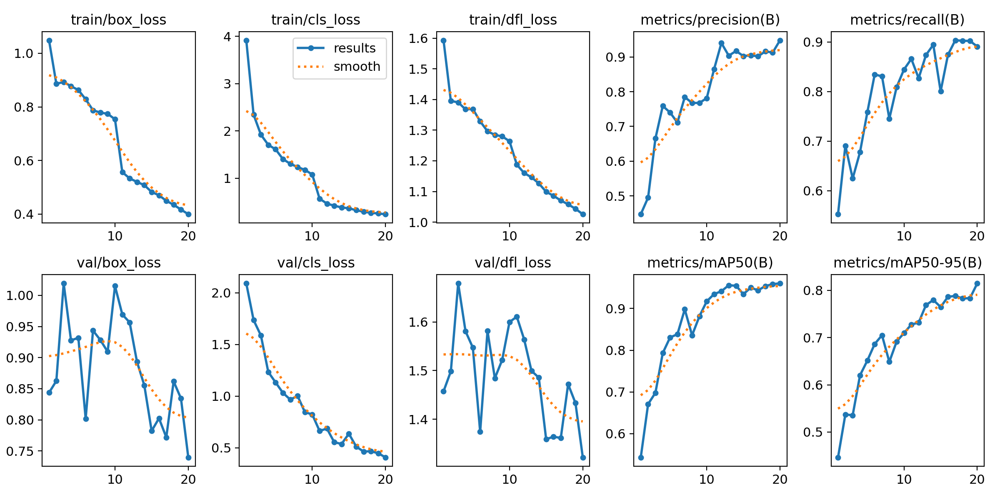

In [58]:
Image(filename='/content/TP-CV/runs-2/detect/train/results.png', width=600)

## Validación

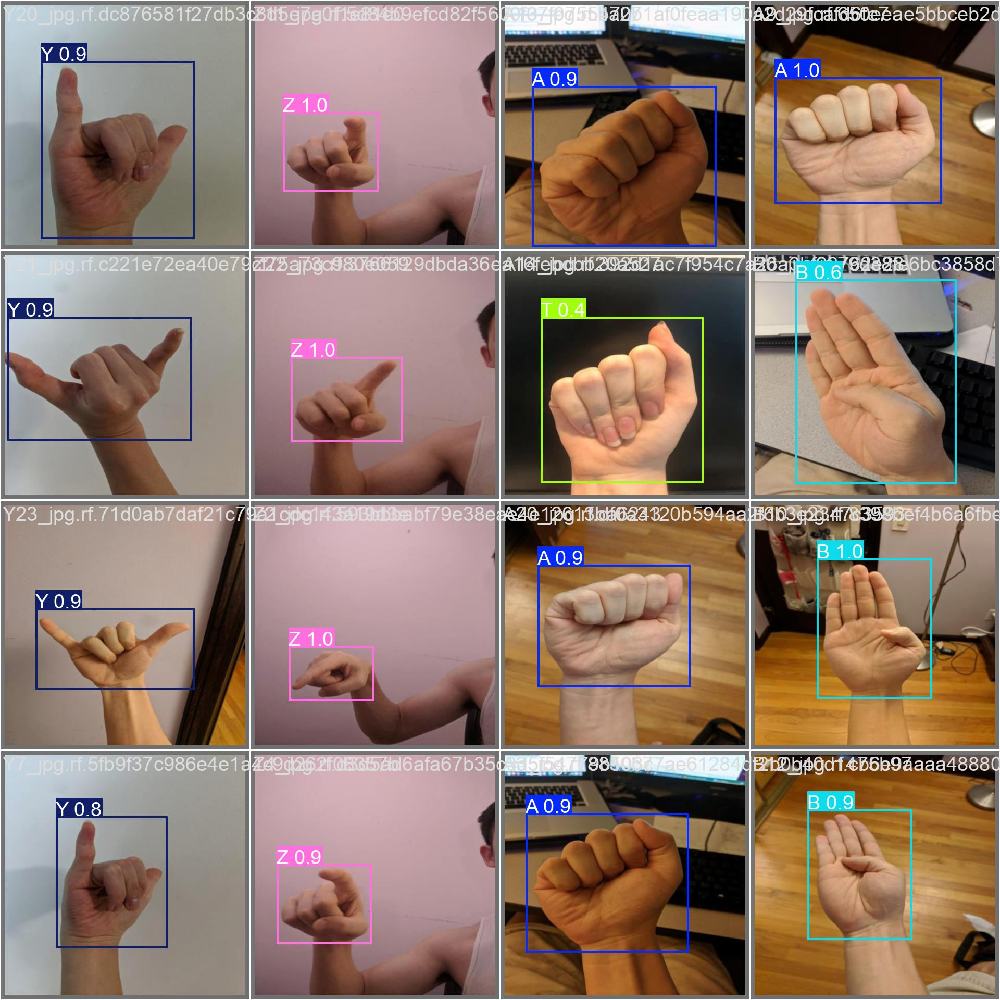

In [61]:
Image(filename='/content/TP-CV/runs-2/detect/train/val_batch0_pred.jpg', width=600)

## Validamos el modelo

In [62]:
!yolo task=detect mode=val model=/content/TP-CV/runs-2/detect/train/weights/best.pt data=/content/TP-CV/datasets/American-Sign-Language-Letters-1/data.yaml

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,854,814 parameters, 0 gradients, 78.8 GFLOPs
val: Scanning /content/datasets/American-Sign-Language-Letters-1/valid/labels.cache... 144 images, 0 backgrounds, 0 corrupt: 100% 144/144 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 9/9 [00:06<00:00,  1.36it/s]
                   all        144        144      0.948      0.891       0.96      0.818
                     A          5          5      0.947        0.8       0.92       0.82
                     B          9          9          1      0.793      0.995       0.87
                     C          3          3      0.948          1      0.995      0.853
                     D          6          6          1      0.852      0.995      0.914
                     E          4          4      0.967          1      0.995      0.854
                     F

## Testing del modelo

In [64]:
!yolo task=detect mode=predict model=/content/TP-CV/runs-2/detect/train/weights/best.pt conf=0.25 source=/content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,854,814 parameters, 0 gradients, 78.8 GFLOPs

image 1/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/A22_jpg.rf.f02ad8558ce1c88213b4f83c0bc66bc8.jpg: 800x800 1 A, 59.0ms
image 2/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B14_jpg.rf.ed5ba6d44f55ab03e62d2baeac4aa1aa.jpg: 800x800 1 B, 51.2ms
image 3/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B15_jpg.rf.0f0628552139144fc67c453e1f1b7b15.jpg: 800x800 1 B, 51.2ms
image 4/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B19_jpg.rf.69527cc1f34d694cc04e55db80ed9b1a.jpg: 800x800 1 B, 51.3ms
image 5/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/C17_jpg.rf.ceb81f8ae3c3673bd060ebe71848eca8.jpg: 800x800 1 C, 51.2ms
image 6/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/C19_jpg.r

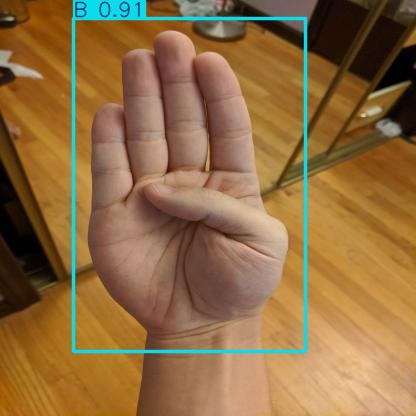

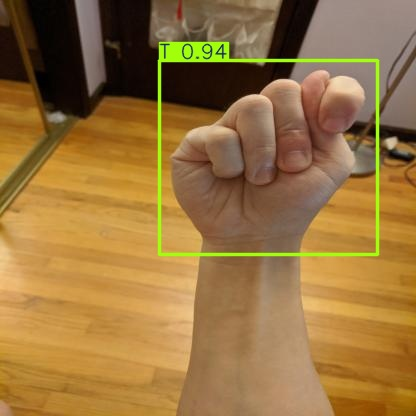

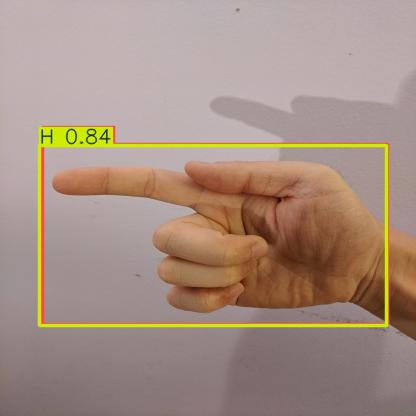

In [67]:
# Obtener todos los archivos en la carpeta
image_dir = '/content/runs/detect/predict2'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Seleccionar 3 imágenes al azar
random_images = random.sample(image_files, 3)

# Mostrar las imágenes seleccionadas al azar
for image_name in random_images:
    image_path = os.path.join(image_dir, image_name)
    display(Image(filename=image_path, width=600))
    print("\n")

## **Testing con imagenes nuevas**

In [71]:
!yolo task=detect mode=predict model=/content/TP-CV/runs-3/detect/train/weights/best.pt conf=0.25 source=/content/new_test_images save=True


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,135,646 parameters, 0 gradients, 28.5 GFLOPs

image 1/9 /content/new_test_images/1.jpeg: 800x608 1 A, 1 T, 42.0ms
image 2/9 /content/new_test_images/2.jpeg: 800x608 1 B, 19.3ms
image 3/9 /content/new_test_images/3.jpeg: 800x608 1 C, 19.3ms
image 4/9 /content/new_test_images/4.jpeg: 800x608 1 K, 19.3ms
image 5/9 /content/new_test_images/5.jpeg: 800x608 1 L, 19.3ms
image 6/9 /content/new_test_images/6.jpeg: 800x608 1 C, 19.3ms
image 7/9 /content/new_test_images/7.jpeg: 800x608 (no detections), 19.3ms
image 8/9 /content/new_test_images/8.jpeg: 800x608 1 T, 19.3ms
image 9/9 /content/new_test_images/9.jpeg: 800x608 1 K, 19.4ms
Speed: 3.5ms preprocess, 21.8ms inference, 68.8ms postprocess per image at shape (1, 3, 800, 608)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


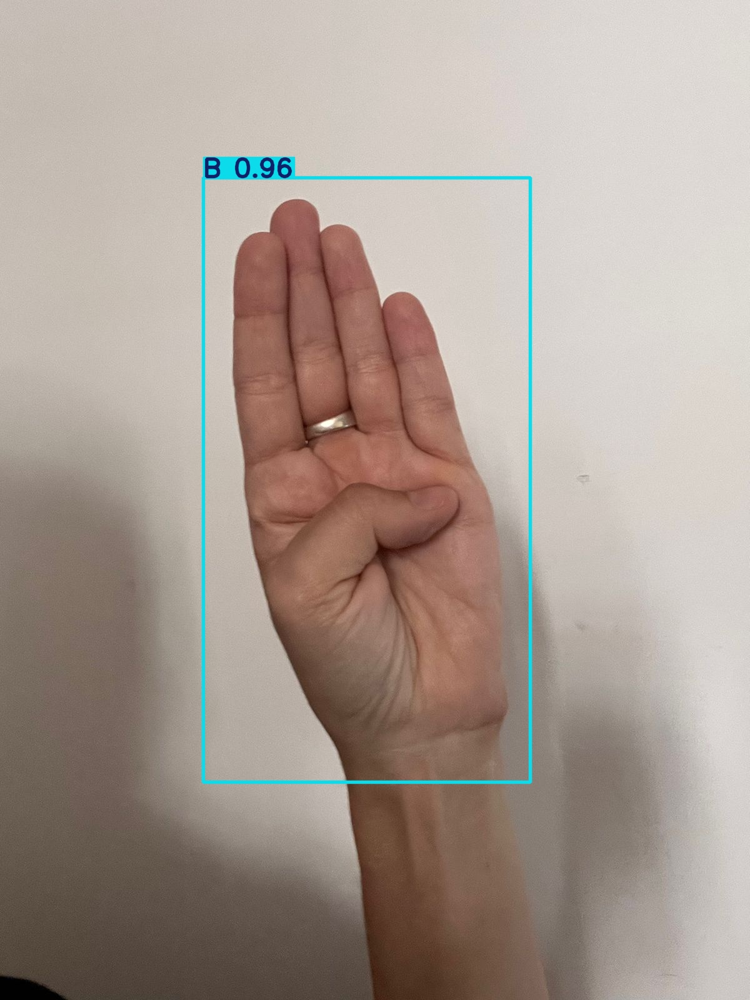

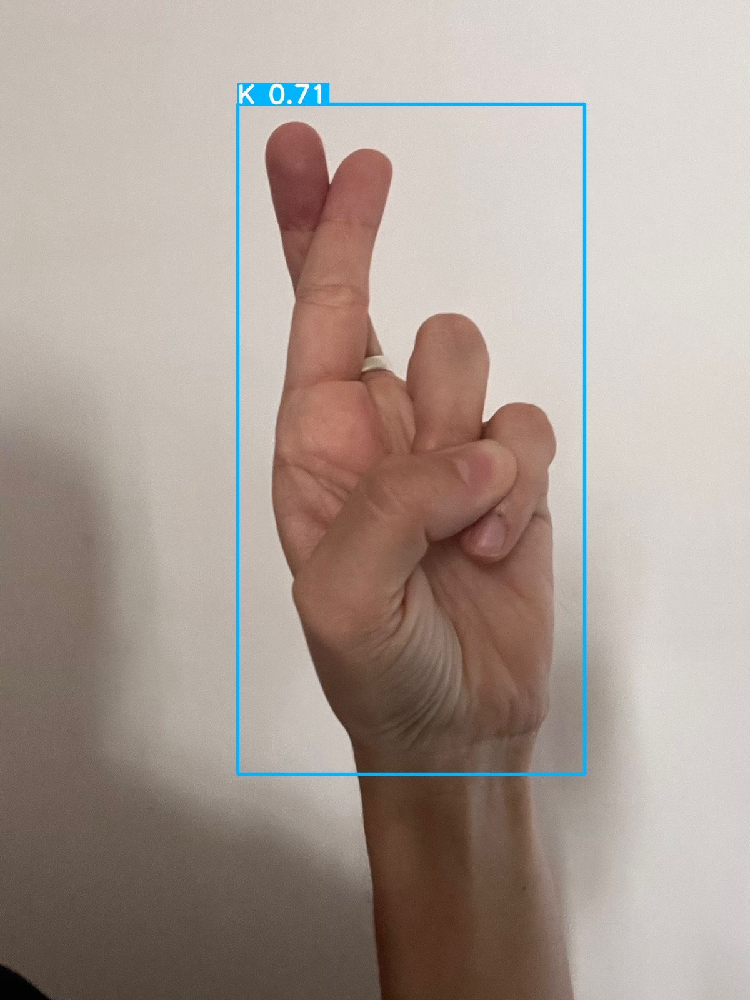

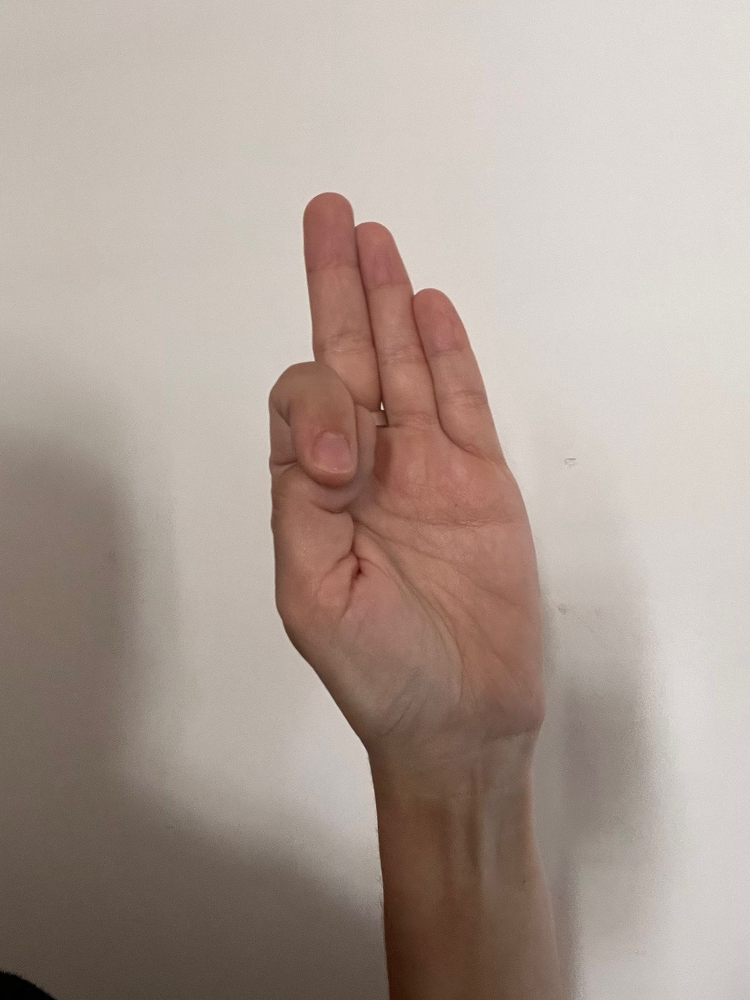

In [73]:
# Obtener todos los archivos en la carpeta
image_dir = '/content/runs/detect/predict5'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Seleccionar 3 imágenes al azar
random_images = random.sample(image_files, 3)

# Mostrar las imágenes seleccionadas al azar
for image_name in random_images:
    image_path = os.path.join(image_dir, image_name)
    display(Image(filename=image_path, width=600))
    print("\n")


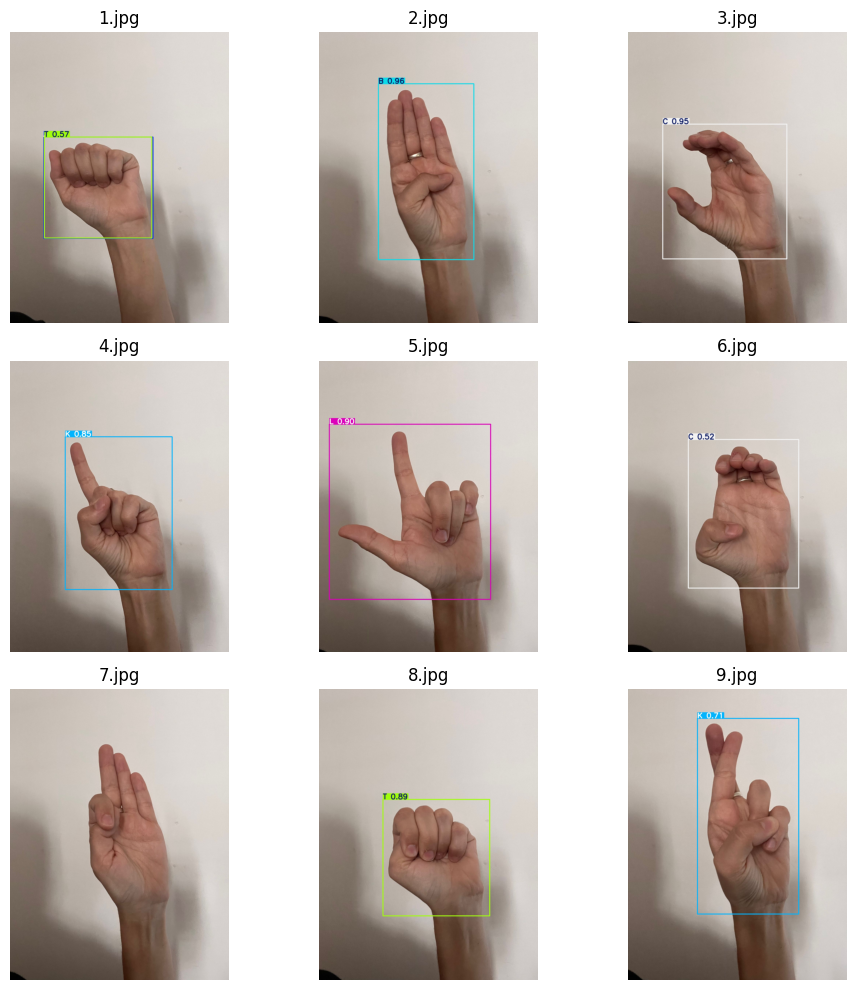

In [74]:
from PIL import Image # Make sure to import the correct Image class from PIL

# Obtener todos los archivos de imagen (filtrar por extensión .jpg, .png, etc.)
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Ordenar las imágenes por nombre (opcional)
image_files.sort()

# Mostrar las primeras 9 imágenes en una cuadrícula de 3x3
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    if i < len(image_files):  # Asegurarse de no exceder la cantidad de imágenes
        img_path = os.path.join(image_dir, image_files[i])
        img = Image.open(img_path) # Use the Image class from PIL
        ax.imshow(img)
        ax.set_title(image_files[i])  # Mostrar el nombre del archivo como título (opcional)
        ax.axis('off')  # Ocultar ejes
    else:
        ax.axis('off')  # Desactivar ejes para celdas vacías

plt.tight_layout()
plt.show()

## **Testing con video**

In [87]:
!yolo task=detect mode=predict model=/content/TP-CV/runs-2/detect/train/weights/best.pt conf=0.25 source='/content/video.mp4'

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,854,814 parameters, 0 gradients, 78.8 GFLOPs

video 1/1 (frame 1/2423) /content/video.mp4: 800x800 1 E, 59.1ms
video 1/1 (frame 2/2423) /content/video.mp4: 800x800 (no detections), 51.2ms
video 1/1 (frame 3/2423) /content/video.mp4: 800x800 (no detections), 51.3ms
video 1/1 (frame 4/2423) /content/video.mp4: 800x800 (no detections), 44.7ms
video 1/1 (frame 5/2423) /content/video.mp4: 800x800 (no detections), 35.2ms
video 1/1 (frame 6/2423) /content/video.mp4: 800x800 1 S, 35.2ms
video 1/1 (frame 7/2423) /content/video.mp4: 800x800 1 S, 33.0ms
video 1/1 (frame 8/2423) /content/video.mp4: 800x800 1 S, 30.1ms
video 1/1 (frame 9/2423) /content/video.mp4: 800x800 1 S, 31.0ms
video 1/1 (frame 10/2423) /content/video.mp4: 800x800 1 S, 30.1ms
video 1/1 (frame 11/2423) /content/video.mp4: 800x800 1 S, 30.3ms
video 1/1 (frame 12/2423) /content/video.mp4: 800x800 1 S, 30.9ms
vid

In [91]:
from IPython.display import HTML
from base64 import b64encode

In [92]:
# Input video path
save_path = '/content/runs/detect/predict8/video.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# **Modelo N°3**

In [ ]:
!yolo task=detect mode=train model=/content/yolov8s.pt data=/content/datasets/American-Sign-Language-Letters-1/data.yaml epochs=20 imgsz=800

100% 21.5M/21.5M [00:00<00:00, 254MB/s]
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/yolov8s.pt, data=/content/datasets/American-Sign-Language-Letters-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fa

In [ ]:
import shutil

# Define la ruta de la carpeta que quieres descargar
folder_path = '/content/runs'

# Define el nombre del archivo comprimido
zip_file = 'runs-3.zip'  # Reemplaza con la ruta y nombre del archivo .zip

# Comprimir la carpeta
shutil.make_archive(zip_file.replace('.zip', ''), 'zip', folder_path)

# Descargar el archivo comprimido
from google.colab import files
files.download(zip_file)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Matriz de confusión

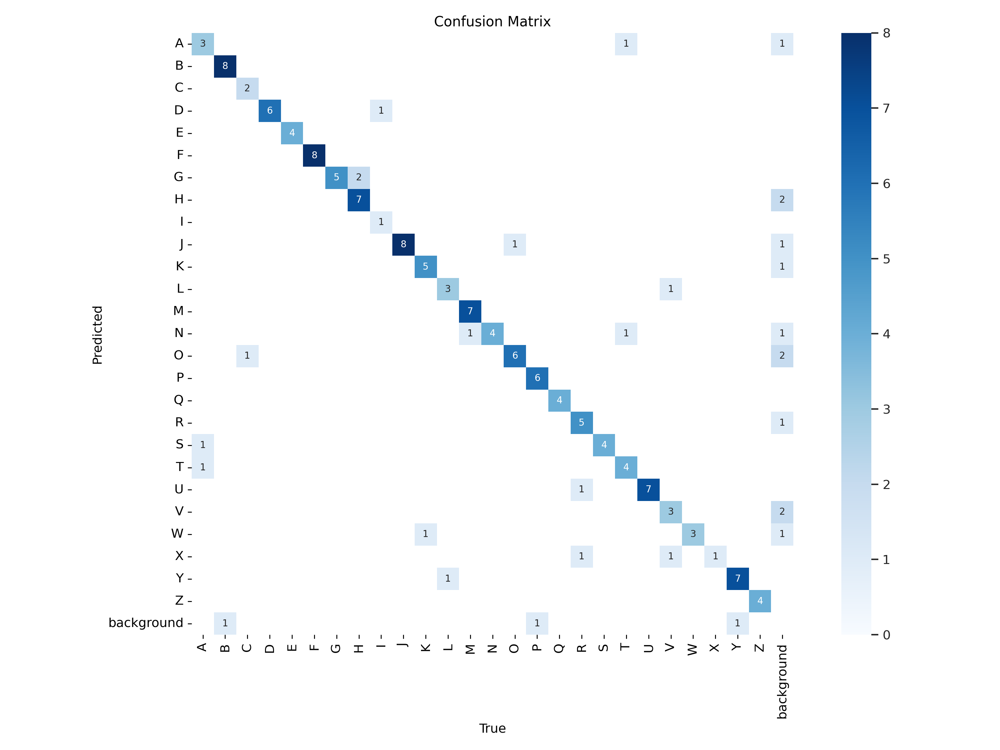

In [54]:
Image(filename='/content/TP-CV/runs-3/detect/train/confusion_matrix.png', width=900)

## Perdida de entrenamiento y validación


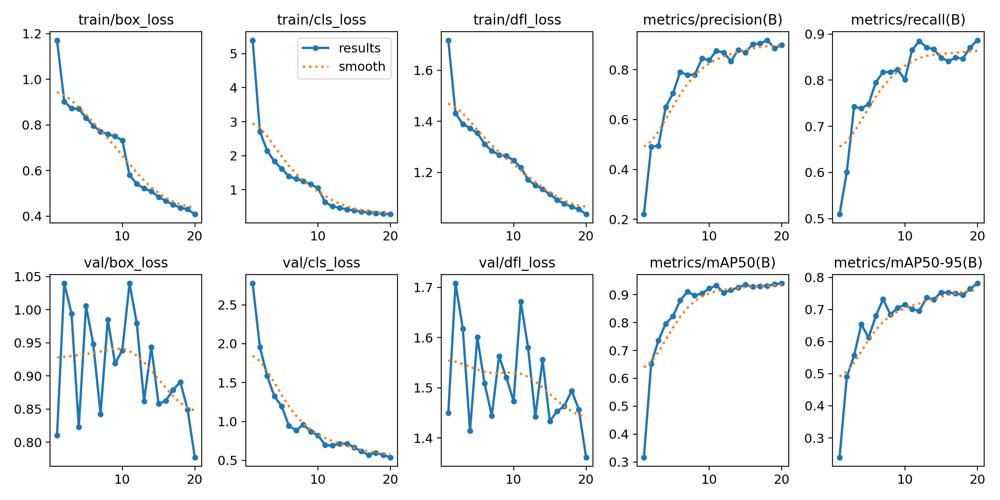

In [57]:
Image(filename='/content/TP-CV/runs-3/detect/train/results.png', width=600)

## Validación

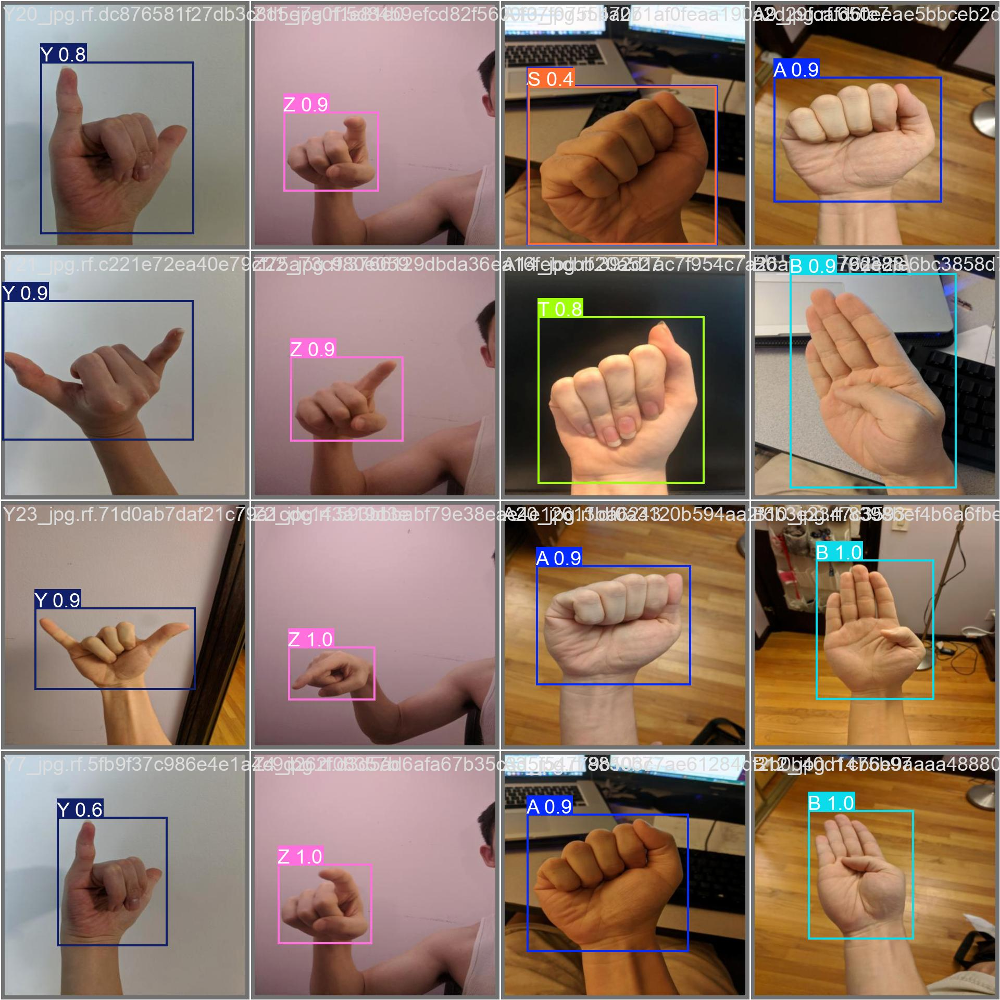

In [59]:
Image(filename='/content/TP-CV/runs-3/detect/train/val_batch0_pred.jpg', width=600)

## Validamos el modelo

In [63]:
!yolo task=detect mode=val model=/content/TP-CV/runs-3/detect/train/weights/best.pt data=/content/TP-CV/datasets/American-Sign-Language-Letters-1/data.yaml

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,135,646 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/datasets/American-Sign-Language-Letters-1/valid/labels.cache... 144 images, 0 backgrounds, 0 corrupt: 100% 144/144 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 9/9 [00:04<00:00,  1.85it/s]
                   all        144        144      0.899      0.886      0.941      0.781
                     A          5          5      0.772      0.689      0.855      0.731
                     B          9          9          1      0.831      0.995      0.838
                     C          3          3          1      0.781      0.995      0.814
                     D          6          6      0.959          1      0.995      0.873
                     E          4          4      0.941          1      0.995      0.822
                     F

## Testing del modelo

In [65]:
!yolo task=detect mode=predict model=/content/TP-CV/runs-3/detect/train/weights/best.pt conf=0.25 source=/content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,135,646 parameters, 0 gradients, 28.5 GFLOPs

image 1/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/A22_jpg.rf.f02ad8558ce1c88213b4f83c0bc66bc8.jpg: 800x800 1 A, 23.0ms
image 2/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B14_jpg.rf.ed5ba6d44f55ab03e62d2baeac4aa1aa.jpg: 800x800 1 B, 25.9ms
image 3/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B15_jpg.rf.0f0628552139144fc67c453e1f1b7b15.jpg: 800x800 1 B, 22.9ms
image 4/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/B19_jpg.rf.69527cc1f34d694cc04e55db80ed9b1a.jpg: 800x800 1 B, 22.9ms
image 5/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/C17_jpg.rf.ceb81f8ae3c3673bd060ebe71848eca8.jpg: 800x800 1 C, 22.9ms
image 6/72 /content/TP-CV/datasets/American-Sign-Language-Letters-1/test/images/C19_jpg.r

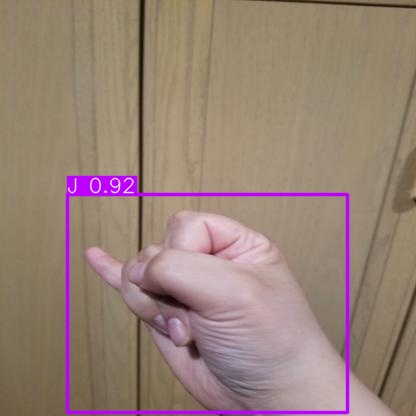

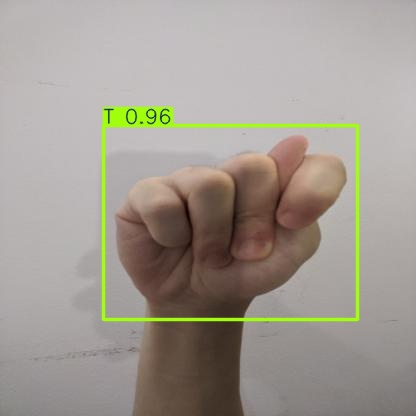

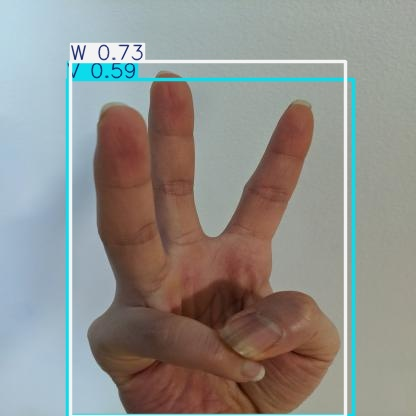

In [69]:
# Obtener todos los archivos en la carpeta
image_dir = '/content/runs/detect/predict3'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Seleccionar 3 imágenes al azar
random_images = random.sample(image_files, 3)

# Mostrar las imágenes seleccionadas al azar
for image_name in random_images:
    image_path = os.path.join(image_dir, image_name)
    display(Image(filename=image_path, width=600))
    print("\n")

## **Testing con imagenes nuevas**

In [76]:
!yolo task=detect mode=predict model=/content/TP-CV/runs-3/detect/train/weights/best.pt conf=0.25 source=/content/new_test_images save=True


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,135,646 parameters, 0 gradients, 28.5 GFLOPs

image 1/9 /content/new_test_images/1.jpeg: 800x608 1 A, 1 T, 42.6ms
image 2/9 /content/new_test_images/2.jpeg: 800x608 1 B, 19.3ms
image 3/9 /content/new_test_images/3.jpeg: 800x608 1 C, 19.3ms
image 4/9 /content/new_test_images/4.jpeg: 800x608 1 K, 19.3ms
image 5/9 /content/new_test_images/5.jpeg: 800x608 1 L, 19.3ms
image 6/9 /content/new_test_images/6.jpeg: 800x608 1 C, 19.3ms
image 7/9 /content/new_test_images/7.jpeg: 800x608 (no detections), 19.2ms
image 8/9 /content/new_test_images/8.jpeg: 800x608 1 T, 19.3ms
image 9/9 /content/new_test_images/9.jpeg: 800x608 1 K, 19.2ms
Speed: 3.4ms preprocess, 21.9ms inference, 81.2ms postprocess per image at shape (1, 3, 800, 608)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


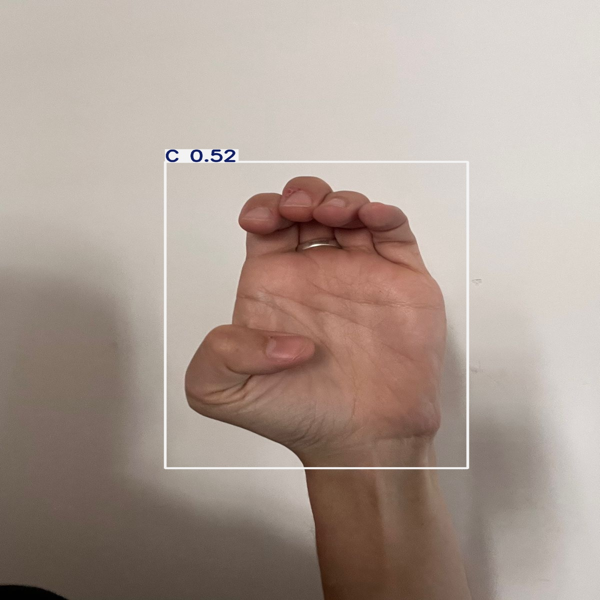

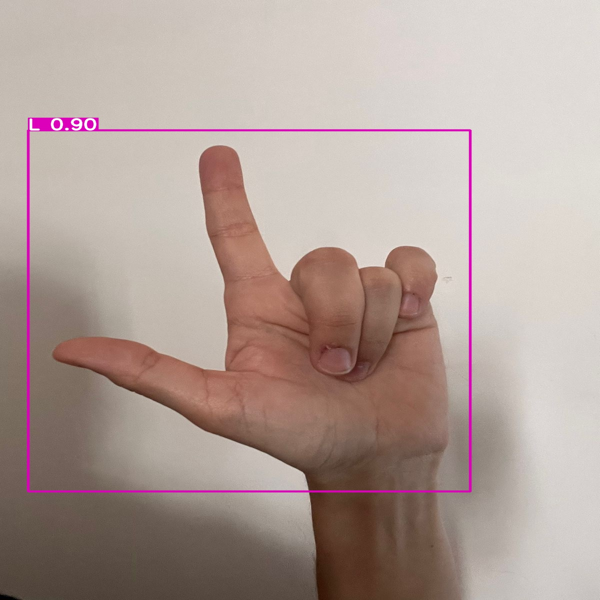

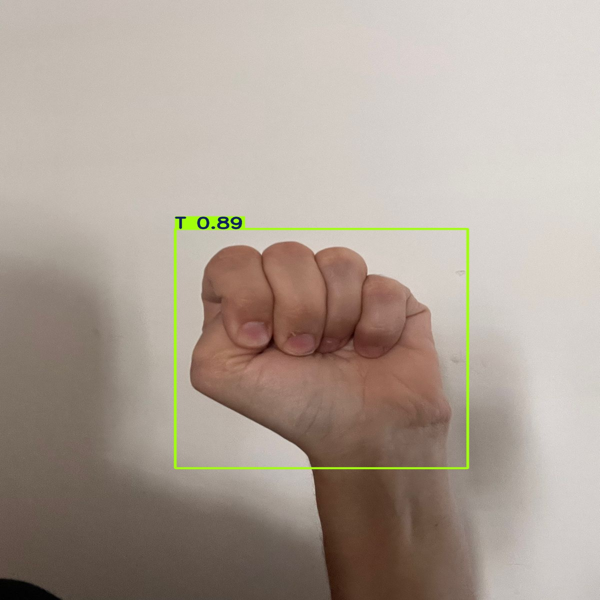

In [81]:
from PIL import Image as PILImage # Import Image class from PIL and alias it
import os
import random
from IPython.display import display

# Obtener todos los archivos en la carpeta
image_dir = '/content/runs/detect/predict6'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Seleccionar 3 imágenes al azar
random_images = random.sample(image_files, 3)

# Mostrar las imágenes seleccionadas al azar
for image_name in random_images:
    image_path = os.path.join(image_dir, image_name)
    display(PILImage.open(image_path).resize((600, 600))) # call the Image class from PIL using the alias
    print("\n")

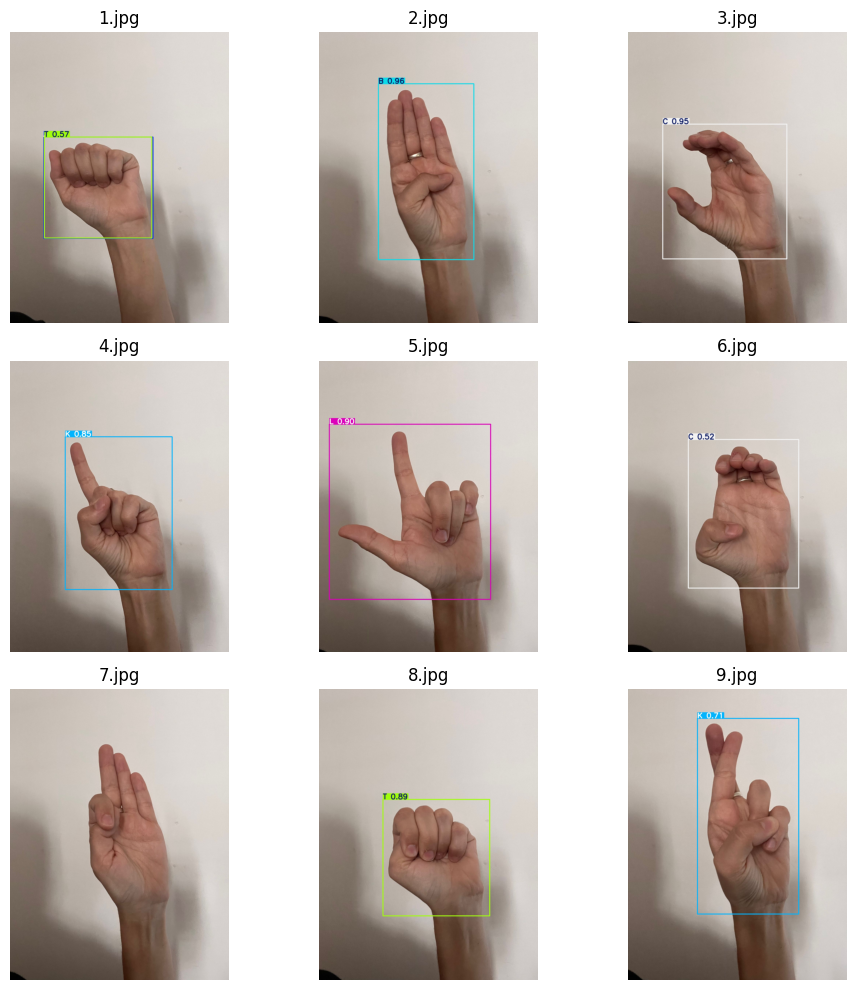

In [78]:
from PIL import Image # Make sure to import the correct Image class from PIL

# Obtener todos los archivos de imagen (filtrar por extensión .jpg, .png, etc.)
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Ordenar las imágenes por nombre (opcional)
image_files.sort()

# Mostrar las primeras 9 imágenes en una cuadrícula de 3x3
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    if i < len(image_files):  # Asegurarse de no exceder la cantidad de imágenes
        img_path = os.path.join(image_dir, image_files[i])
        img = Image.open(img_path) # Use the Image class from PIL
        ax.imshow(img)
        ax.set_title(image_files[i])  # Mostrar el nombre del archivo como título (opcional)
        ax.axis('off')  # Ocultar ejes
    else:
        ax.axis('off')  # Desactivar ejes para celdas vacías

plt.tight_layout()
plt.show()

## **Testing con video**

In [85]:
!yolo task=detect mode=predict model=/content/TP-CV/runs-3/detect/train/weights/best.pt conf=0.25 source='/content/video.mp4'

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,135,646 parameters, 0 gradients, 28.5 GFLOPs

video 1/1 (frame 1/2423) /content/video.mp4: 800x800 (no detections), 22.9ms
video 1/1 (frame 2/2423) /content/video.mp4: 800x800 (no detections), 23.0ms
video 1/1 (frame 3/2423) /content/video.mp4: 800x800 1 S, 23.0ms
video 1/1 (frame 4/2423) /content/video.mp4: 800x800 1 S, 23.0ms
video 1/1 (frame 5/2423) /content/video.mp4: 800x800 1 S, 22.9ms
video 1/1 (frame 6/2423) /content/video.mp4: 800x800 1 S, 22.9ms
video 1/1 (frame 7/2423) /content/video.mp4: 800x800 1 S, 22.9ms
video 1/1 (frame 8/2423) /content/video.mp4: 800x800 1 S, 22.9ms
video 1/1 (frame 9/2423) /content/video.mp4: 800x800 1 S, 22.9ms
video 1/1 (frame 10/2423) /content/video.mp4: 800x800 1 S, 22.9ms
video 1/1 (frame 11/2423) /content/video.mp4: 800x800 1 S, 22.9ms
video 1/1 (frame 12/2423) /content/video.mp4: 800x800 1 S, 22.9ms
video 1/1 (frame 13/2423) /

In [93]:
# Input video path
save_path = '/content/runs/detect/predict7/video.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)